<h1><center>Mice Protein Expression</center></h1>

Expression levels of 77 proteins measured in the cerebral cortex of 8 classes of control and Down syndrome mice exposed to context fear conditioning, a task used to assess associative learning.

## Content

The data set consists of the expression levels of 77 proteins/protein modifications that produced detectable signals in the nuclear fraction of cortex. There are 38 control mice and 34 trisomic mice (Down syndrome), for a total of 72 mice. In the experiments, 15 measurements were registered of each protein per sample/mouse. Therefore, for control mice, there are 38x15, or 570 measurements, and for trisomic mice, there are 34x15, or 510 measurements. The dataset contains a total of 1080 measurements per protein. Each measurement can be considered as an independent sample/mouse. The eight classes of mice are described based on features such as genotype, behavior and treatment. According to genotype, mice can be control or trisomic. According to behavior, some mice have been stimulated to learn (context-shock) and others have not (shock-context) and in order to assess the effect of the drug memantine in recovering the ability to learn in trisomic mice, some mice have been injected with the drug and others have not.
Exploratory Data Analysis
### Aim :

* Understand the Data
* Begin to develop a modelling strategy

<br>

### Target

#### Classes:
|Class Name|Description|
|---|---|
|**c-CS-s**|control mice, stimulated to learn, injected with saline (9 mice)|
|**c-CS-m**|control mice, stimulated to learn, injected with memantine (10 mice)|
|**c-SC-s**|control mice, not stimulated to learn, injected with saline (9 mice)|
|**c-SC-m**|control mice, not stimulated to learn, injected with memantine (10 mice)|
|**t-CS-s**|trisomy mice, stimulated to learn, injected with saline (7 mice)|
|**t-CS-m**|trisomy mice, stimulated to learn, injected with memantine (9 mice)|
|**t-SC-s**|trisomy mice, not stimulated to learn, injected with saline (9 mice)|
|**t-SC-m**|trisomy mice, not stimulated to learn, injected with memantine (9 mice)|

#### Features
|Column Index|Content|
|---|---|
|[1]|Mouse ID|
|[2:78]| Values of expression levels of 77 proteins; the names of proteins are followed by N indicating that they were measured in the nuclear fraction. eg: DYRK1A_n|
|[79]|Genotype: control (c) or trisomy (t)|
|[80]|Treatment type: memantine (m) or saline (s)|
|[81]|Behavior: context-shock (CS) or shock-context (SC)|
|[82]|Class|

In [1]:
!pip install -r '../requirements.txt' -q

In [2]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import math
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import ols
import warnings
import random

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
sns.set_theme(style="darkgrid")

In [3]:
df = pd.read_csv('./Data/Data_Cortex_Nuclear.csv')
df.head()

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,pERK_N,pJNK_N,PKCA_N,pMEK_N,pNR1_N,pNR2A_N,pNR2B_N,pPKCAB_N,pRSK_N,AKT_N,BRAF_N,CAMKII_N,CREB_N,ELK_N,ERK_N,GSK3B_N,JNK_N,MEK_N,TRKA_N,RSK_N,APP_N,Bcatenin_N,SOD1_N,MTOR_N,P38_N,pMTOR_N,DSCR1_N,AMPKA_N,NR2B_N,pNUMB_N,RAPTOR_N,TIAM1_N,pP70S6_N,NUMB_N,P70S6_N,pGSK3B_N,pPKCG_N,CDK5_N,S6_N,ADARB1_N,AcetylH3K9_N,RRP1_N,BAX_N,ARC_N,ERBB4_N,nNOS_N,Tau_N,GFAP_N,GluR3_N,GluR4_N,IL1B_N,P3525_N,pCASP9_N,PSD95_N,SNCA_N,Ubiquitin_N,pGSK3B_Tyr216_N,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,0.687906,0.306382,0.402698,0.296927,1.022060,0.605673,1.877684,2.308745,0.441599,0.859366,0.416289,0.369608,0.178944,1.866358,3.685247,1.537227,0.264526,0.319677,0.813866,0.165846,0.453910,3.037621,0.369510,0.458539,0.335336,0.825192,0.576916,0.448099,0.586271,0.394721,0.339571,0.482864,0.294170,0.182150,0.842725,0.192608,1.443091,0.294700,0.354605,1.339070,0.170119,0.159102,0.188852,0.106305,0.144989,0.176668,0.125190,0.115291,0.228043,0.142756,0.430957,0.247538,1.603310,2.014875,0.108234,1.044979,0.831557,0.188852,0.122652,NaN,0.106305,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,0.695006,0.299051,0.385987,0.281319,0.956676,0.587559,1.725774,2.043037,0.445222,0.834659,0.400364,0.356178,0.173680,1.761047,3.485287,1.509249,0.255727,0.304419,0.780504,0.157194,0.430940,2.921882,0.342279,0.423560,0.324835,0.761718,0.545097,0.420876,0.545097,0.368255,0.321959,0.454519,0.276431,0.182086,0.847615,0.194815,1.439460,0.294060,0.354548,1.306323,0.171427,0.158129,0.184570,0.106592,0.150471,0.178309,0.134275,0.118235,0.238073,0.142037,0.457156,0.257632,1.671738,2.004605,0.109749,1.009883,0.849270,0.200404,0.116682,NaN,0.106592,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,1.561316,0.677348,0.291276,0.381002,0.281710,1.003635,0.602449,1.731873,2.017984,0.467668,0.814329,0.399847,0.368089,0.173905,1.765544,3.571456,1.501244,0.259614,0.311747,0.785154,0.160895,0.423187,2.944136,0.343696,0.425005,0.324852,0.757031,0.543620,0.404630,0.552994,0.363880,0.313086,0.447197,0.256648,0.184388,0.856166,0.200737,1.524364,0.301881,0.386087,1.279600,0.185456,0.148696,0.190532,0.108303,0.145330,0.176213,0.132560,0.117760,0.244817,0.142445,0.510472,0.255343,1.663550,2.016831,0.108196,0.996848,0.846709,0.193685,0.118508,NaN,0.108303,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,0.583277,0.296729,0.377087,0.313832,0.875390,0.520293,1.566852,2.132754,0.477671,0.727705,0.385639,0.362970,0.179449,1.286277,2.970137,1.419710,0.259536,0.279218,0.734492,0.162210,0.410615,2.500204,0.344509,0.429211,0.330121,0.746980,0.546763,0.386860,0.547849,0.366771,0.328492,0.442650,0.398534,0.161768,0.760234,0.184169,1.612382,0.296382,0.290680,1.198765,0.159799,0.166112,0.185323,0.103184,0.140656,0.163804,0.123210,0.117439,0.234947,0.145068,0.430996,0.251103,1.484624,1.957233,0.119883,0.990225,0.833277,0.192112,0.132781,NaN,0.103184,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,1.504230,0.550960,0.286961,0.363502,0.277964,0.864912,0.507990,1.480059,2.013697,0.483416,0.687794,0.367531,0.355311,0.174836,1.324695,2.896334,1.359876,0.250705,0.273667,0.702699,0.154827,0.398550,2.456560,0.329126,0.408755,0.313415,0.691956,0.536860,0.360816,0.512824,0.351551,0.312206,0.419095,0.393447,0.160200,0.768113,0.185718,1.645807,0.296829,0.309345,1.206995,0.164650,0.

In [4]:
df.shape

(1080, 82)

In [5]:
df.select_dtypes(include='object').shape[1]

5

In [6]:
df.columns = df.columns.str.replace('_N' , '')
df.rename(columns = {'class':'Class'}, inplace = True)

In [7]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1080 entries, 0 to 1079
Data columns (total 82 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MouseID        1080 non-null   object 
 1   DYRK1A         1077 non-null   float64
 2   ITSN1          1077 non-null   float64
 3   BDNF           1077 non-null   float64
 4   NR1            1077 non-null   float64
 5   NR2A           1077 non-null   float64
 6   pAKT           1077 non-null   float64
 7   pBRAF          1077 non-null   float64
 8   pCAMKII        1077 non-null   float64
 9   pCREB          1077 non-null   float64
 10  pELK           1077 non-null   float64
 11  pERK           1077 non-null   float64
 12  pJNK           1077 non-null   float64
 13  PKCA           1077 non-null   float64
 14  pMEK           1077 non-null   float64
 15  pNR1           1077 non-null   float64
 16  pNR2A          1077 non-null   float64
 17  pNR2B          1077 non-null   float64
 18  pPKCAB  

In [8]:
df.describe()

,DYRK1A,ITSN1,BDNF,NR1,NR2A,pAKT,pBRAF,pCAMKII,pCREB,pELK,pERK,pJNK,PKCA,pMEK,pNR1,pNR2A,pNR2B,pPKCAB,pRSK,AKT,BRAF,CAMKII,CREB,ELK,ERK,GSK3B,JNK,MEK,TRKA,RSK,APP,Bcatenin,SOD1,MTOR,P38,pMTOR,DSCR1,AMPKA,NR2B,pNUMB,RAPTOR,TIAM1,pP70S6,NUMB,P70S6,pGSK3B,pPKCG,CDK5,S6,ADARB1,AcetylH3K9,RRP1,BAX,ARC,ERBB4,nNOS,Tau,GFAP,GluR3,GluR4,IL1B,P3525,pCASP9,PSD95,SNCA,Ubiquitin,pGSK3B_Tyr216,SHH,BAD,BCL2,pS6,pCFOS,SYP,H3AcK18,EGR1,H3MeK4,CaNA
count,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1062.000000,1077.000000,1077.000000,1077.000000,1073.000000,1077.000000,1077.000000,1077.000000,1062.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,1080.000000,867.000000,795.000000,1080.000000,1005.000000,1080.000000,900.000000,870.000000,810.000000,1080.000000
mean,0.425810,0.617102,0.319088,2.297269,3.843934,0.233168,0.181846,3.537109,0.212574,1.428682,0.545904,0.313505,0.317939,0.275033,0.825813,0.726933,1.561965,1.525338,0.442848,0.682236,0.378519,0.363357,0.180492,1.173400,2.474492,1.172603,0.241644,0.272789,0.693180,0.168417,0.404808,2.146550,0.542635,0.452459,0.415311,0.759047,0.585186,0.368370,0.565317,0.357095,0.315813,0.418605,0.394475,0.181080,0.943116,0.161211,1.706599,0.292434,0.429226,1.197420,0.216482,0.166631,0.179307,0.121521,0.156478,0.181300,0.210489,0.120889,0.221851,0.126560,0.527349,0.291276,1.548348,2.235236,0.159821,1.239270,0.848767,0.226676,0.157914,0.134762,0.121521,0.131053,0.446073,0.169609,0.183135,0.205440,1.337784
std,0.249362,0.251640,0.049383,0.347293,0.933100,0.041634,0.027042,1.295169,0.032587,0.466904,0.345309,0.051978,0.052236,0.046164,0.117969,0.188013,0.270737,0.481780,0.066672,0.127434,0.216388,0.052352,0.026370,0.335786,0.653397,0.244752,0.033901,0.041075,0.120825,0.028138,0.061173,0.435742,0.280568,0.065488,0.089290,0.122446,0.100601,0.062583,0.088201,0.063025,0.054163,0.067288,0.156170,0.029296,0.172838,0.019308,0.578442,0.037380,0.137440,0.361743,0.185309,0.031896,0.018826,0.014276,0.015071,0.024919,0.069010,0.013233,0.034886,0.026885,0.082057,0.030015,0.248132,0.254395,0.024150,0.173580,0.094311,0.028989,0.029537,0.027417,0.014276,0.023863,0.066432,0.059402,0.040406,0.055514,0.317126
min,0.145327,0.245359,0.115181,1.330831,1.737540,0.063236,0.064043,1.343998,0.112812,0.429032,0.149155,0.052110,0.191431,0.056818,0.500160,0.281285,0.301609,0.567840,0.095942,0.064421,0.143894,0.212960,0.113636,0.497695,1.131796,0.151124,0.046298,0.147201,0.198743,0.107394,0.235595,1.134886,0.217120,0.201143,0.227880,0.166579,0.155321,0.226409,0.184785,0.185598,0.194824,0.237777,0.131120,0.117999,0.344120,0.099976,0.598767,0.181157,0.130206,0.529108,0.052528,-0.062008,0.072326,0.067254,0.100217,0.099734,0.096233,0.086114,0.111382,0.072580,0.284001,0.207438,0.853176,1.206098,0.101233,0.750664,0.577397,0.155869,0.088305,0.080657,0.067254,0.085419,0.258626,0.079691,0.105537,0.101787,0.586479
25%,0.288121,0.473361,0.287444,2.057411,3.155678,0.205755,0.164595,2.479834,0.190823,1.203665,0.337405,0.281242,0.281829,0.244287,0.743491,0.590303,1.381288,1.168258,0.404144,0.596816,0.264334,0.330859,0.161830,0.944435,1.991756,1.023134,0.220400,0.247096,0.617074,0.149622,0.366339,1.826707,0.319639,0.410389,0.351992,0.683501,0.530881,0.326621,0.514892,0.312766,0.276127,0.371976,0.281090,0.159334,0.826742,0.149253,1.296830,0.272594,0.316684,0.930548,0.103571,0.149025,0.168172,0.110839,0.146969,0.166451,0.167991,0.112765,0.195665,0.108895,0.4

### Is target balanced?

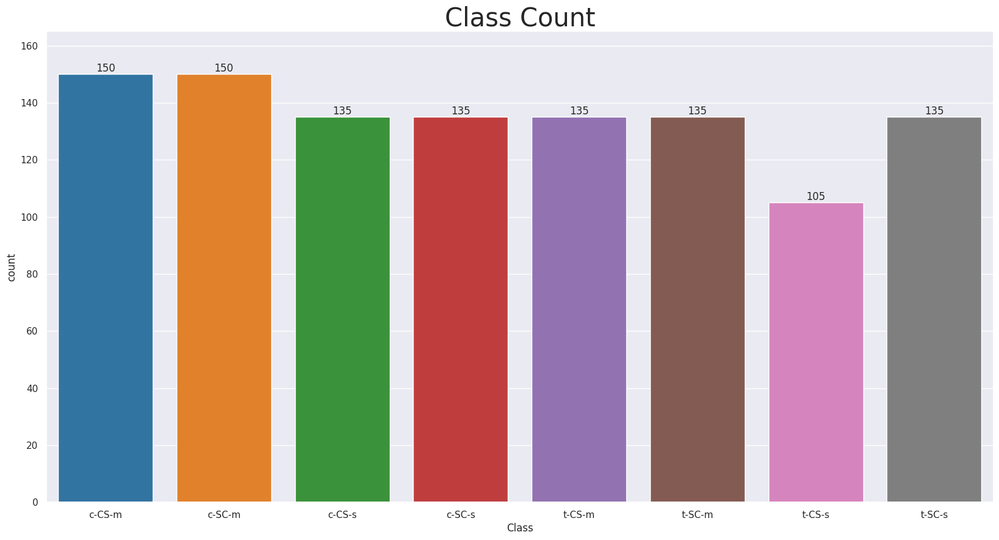

In [9]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.countplot(x='Class', data=df, ax=ax, palette="tab10")
ax.bar_label(ax.containers[0], label_type='edge')
ax.set_title('Class Count', fontsize=30)
ax.margins(y=0.1)

In [10]:
df['Class'].value_counts(normalize=True)*100

c-CS-m    13.888889
c-SC-m    13.888889
c-CS-s    12.500000
c-SC-s    12.500000
t-CS-m    12.500000
t-SC-m    12.500000
t-SC-s    12.500000
t-CS-s     9.722222
Name: Class, dtype: float64

### Where are the missing values?

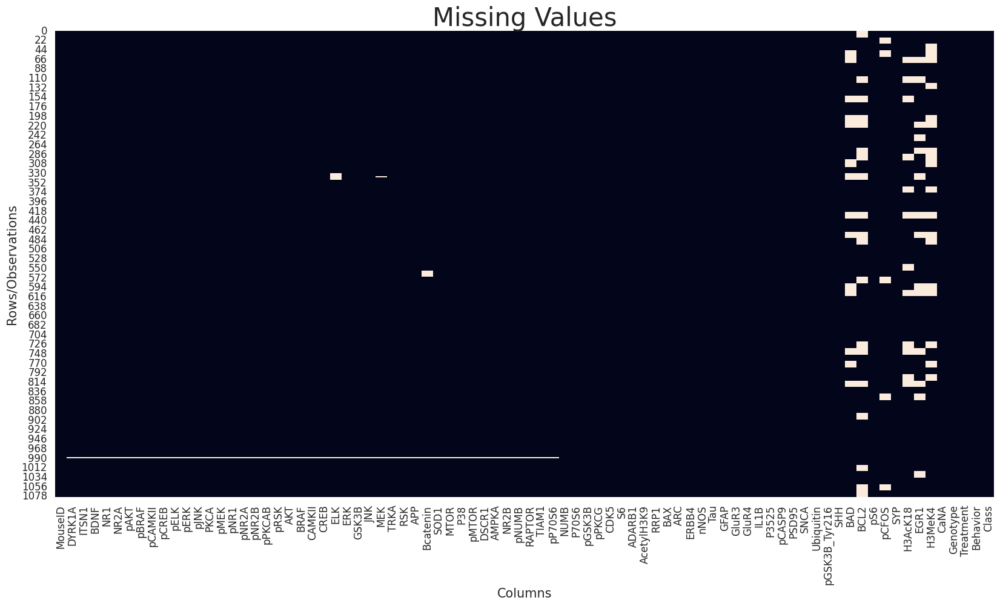

In [11]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(df.isnull(), cbar=False)
ax.set_title('Missing Values', fontsize=30)
ax.set_xlabel('Columns', fontsize=15)
ax.set_ylabel('Rows/Observations', fontsize=15)
ax.tick_params(labelsize=12)
plt.show()

In [12]:
df.isnull().sum()*100/len(df)

MouseID      0.000000
DYRK1A       0.277778
ITSN1        0.277778
BDNF         0.277778
NR1          0.277778
               ...   
CaNA         0.000000
Genotype     0.000000
Treatment    0.000000
Behavior     0.000000
Class        0.000000
Length: 82, dtype: float64

### Initial Inference
Shape Analysis :

&emsp;target feature : Class

&emsp;rows and columns : 1080 , 82

&emsp;features types : qualitatives : 5 , quantitatives : 77

&emsp;NaN analysis : NaN (5 features > 15 % of NaN (all others < 5%))

Columns Analysis :

&emsp;Target Analysis :

&emsp;&emsp;Balanced (Yes/No) : Yes

&emsp;&emsp;Percentages : ~12.5% for each class

&emsp;Categorical values

&emsp;&emsp;There is 4 categorical features (not inluding the target)


In [13]:
protein_types = list(df.columns[1:78])

In [14]:
ncols = 4
nrows = math.ceil(len(protein_types)/4)

### What is the expression level of each protein?

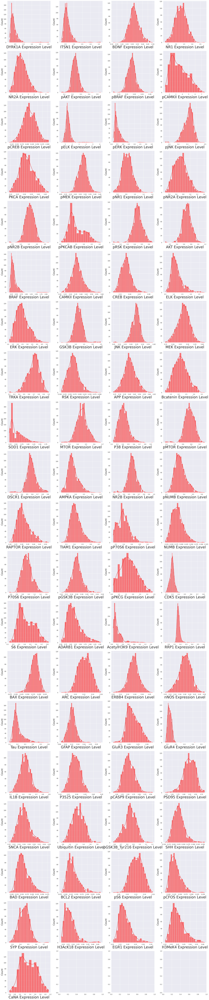

In [15]:
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(30, 150))

for protein, ax in zip(protein_types, axes.flatten()):
    sns.histplot(x=protein, data=df, kde=True, color='red', ax=ax)
    ax.set_xlabel(f'{protein} Expression Level', fontsize=30)
    ax.set_ylabel('Count', fontsize=20)

plt.show()

### Are there any outliers?

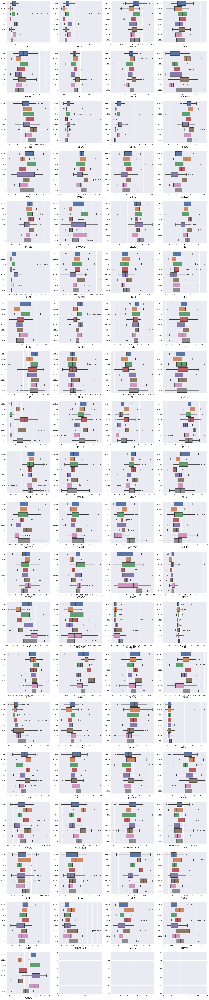

In [16]:
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(30, 150))

for protein, ax in zip(protein_types, axes.flatten()):
    sns.boxplot(x=protein, y='Class', data=df, ax=ax)
    ax.set_xlabel(protein, fontsize=20)
    ax.set_ylabel('', fontsize=1)

plt.show()

# Statistical Analysis

## Handling Outliers, comparing Z-Score and IQR results

In [17]:
outliers_columns = [
    # For Z-Score
    'Outliers with Z-Score', 
    'Outliers Index with Z-Score', 
    'Outlier Count with Z-Score', 
    
    # For IQR Score
    'Outliers with IQR', 
    'Outliers Index with IQR', 
    'Outlier Count with IQR', 
    
    # Parameters
    'Mean', 
    'Standard Deviation', 
    'IQR']

outliers_df = pd.DataFrame(
    pd.NA, 
    index = [protein for protein in protein_types],
    columns=outliers_columns
    )
outliers_df.head()

,Outliers with Z-Score,Outliers Index with Z-Score,Outlier Count with Z-Score,Outliers with IQR,Outliers Index with IQR,Outlier Count with IQR,Mean,Standard Deviation,IQR
DYRK1A,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
ITSN1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
BDNF,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
NR1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
NR2A,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


In [18]:
def detect_outliers_zscore(data):
    outliers = []
    outliers_index = []
    thres = 3
    data = data.dropna()
    data_as_list = data[data.columns[0]].tolist()
    mean = np.mean(data_as_list)
    std = np.std(data_as_list)
    for idx, row in data.iterrows():
        z_score = (row[0]-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(row[0])
            outliers_index.append(idx)
    return outliers, outliers_index, mean, std

for idx, _ in outliers_df.iterrows():
    outliers, outliers_index, mean, std = detect_outliers_zscore(df[[idx]])
    if outliers:
        outliers_df.at[idx, 'Outliers with Z-Score'] = outliers
        outliers_df.at[idx, 'Outliers Index with Z-Score'] = outliers_index
        outliers_df.at[idx, 'Outlier Count with Z-Score'] = len(outliers)
    outliers_df.at[idx, 'Mean'] = mean
    outliers_df.at[idx, 'Standard Deviation'] = std

In [19]:
def detect_outliers_iqr(data):
    outliers = []
    outliers_index = []
    data = data.dropna()
    data_as_list = data[data.columns[0]].tolist()
    data_as_list = sorted(data_as_list)
    q1 = np.percentile(data_as_list, 25)
    q3 = np.percentile(data_as_list, 75)
    iqr = q3-q1
    lwr_bound = q1-(1.5*iqr)
    upr_bound = q3+(1.5*iqr)
    for idx, row in data.iterrows():
        if (row[0]<lwr_bound or row[0]>upr_bound):
            outliers.append(row[0])
            outliers_index.append(idx)                
    return outliers, outliers_index, iqr

for idx, _ in outliers_df.iterrows():
    outliers, outliers_index, iqr = detect_outliers_iqr(df[[idx]])
    if outliers:
        outliers_df.at[idx, 'Outliers with IQR'] = outliers
        outliers_df.at[idx, 'Outliers Index with IQR'] = outliers_index
        outliers_df.at[idx, 'Outlier Count with IQR'] = len(outliers)
    outliers_df.at[idx, 'IQR'] = iqr

In [20]:
outliers_df.head()

,Outliers with Z-Score,Outliers Index with Z-Score,Outlier Count with Z-Score,Outliers with IQR,Outliers Index with IQR,Outlier Count with IQR,Mean,Standard Deviation,IQR
DYRK1A,"[2.480315709, 2.023023578, 2.335802241, 2.1093...","[360, 361, 362, 363, 364, 365, 366, 367, 368, ...",15,"[2.480315709, 2.023023578, 2.335802241, 2.1093...","[360, 361, 362, 363, 364, 365, 366, 367, 368, ...",48,0.42581,0.249246,0.199591
ITSN1,"[2.48868391, 2.519463708, 2.539024164, 1.91365...","[360, 361, 362, 363, 364, 365, 366, 367, 368, ...",15,"[1.063760627, 2.48868391, 2.519463708, 2.53902...","[136, 360, 361, 362, 363, 364, 365, 366, 367, ...",44,0.617102,0.251523,0.22467
BDNF,"[0.470055645, 0.115181402, 0.497159859]","[32, 181, 375]",3,"[0.446958318, 0.464963919, 0.470055645, 0.4418...","[30, 31, 32, 135, 136, 181, 192, 302, 317, 372...",22,0.319088,0.04936,0.060753
NR1,[3.757641331],[375],1,"[3.757641331, 3.337822111, 1.330830671, 1.3468...","[375, 378, 957, 958]",4,2.297269,0.347132,0.47107
NR2A,"[6.766149871, 8.482553422, 7.120759057, 7.0317...","[47, 375, 377, 378]",4,"[6.368256743, 6.766149871, 8.482553422, 7.1207...","[35, 47, 375, 377, 378, 380, 752]",7,3.843934,0.932667,1.284333


From the result above, it seems that IQR method of determining is catching larger chunks of data than the Z-Score method. It seems that Z-Score method has lesser tendency of considering outliers in its ananlysis. If we assume that there is lesser chance of measurement detection faults, weeding out large chunks of data from the ananlysis will hamper the predicition during the model training. Thus, it is better to remove only extreme outliers with Z-Score.

Lets fill the data of extreme outliers found using the Z-Score method with pd.NA

In [21]:
column_to_consider = 'Outliers Index with Z-Score'
for protein, row in outliers_df.iterrows():
    try:
        for idx in row[[column_to_consider]].dropna()[column_to_consider]:
            df.at[idx, protein] = np.nan
    except KeyError:
        print(f'Nothing to remove for {protein}')

Nothing to remove for PKCA
Nothing to remove for pPKCG
Nothing to remove for S6
Nothing to remove for CaNA


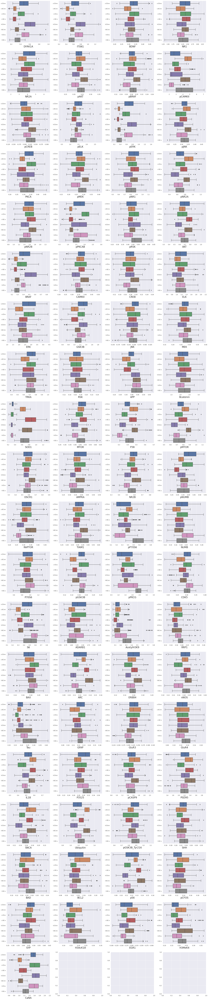

In [22]:
# Plotting the boxplot again
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(30, 150))

for protein, ax in zip(protein_types, axes.flatten()):
    sns.boxplot(x=protein, y='Class', data=df, ax=ax)
    ax.set_xlabel(protein, fontsize=20)
    ax.set_ylabel('', fontsize=1)

plt.show()

Much Better!

# Analysing of Variance with ANOVA

**Null Hypothesis**: there are no diferrences in expression level mean between classes.

$$H_0:μ_1=μ_2=μ_3=μ_4=μ_5=μ_6=μ_7=μ_8$$

**Alternate Hypothesis**: there is at least one significant difference among the groups.

$$H_A:μ_1≠μ_2≠μ_3≠μ_4≠μ_5≠μ_6≠μ_7≠μ_8$$

**Significance Level**:

$$α=0.01$$

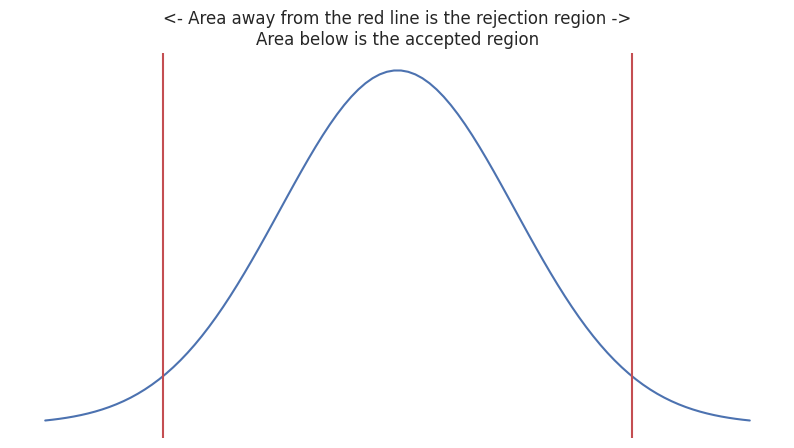

In [23]:
mu = 0
variance = 1
sigma = math.sqrt(variance)
x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
ax = plt.subplots(figsize=(10, 5))
plt.plot(x, stats.norm.pdf(x, mu, sigma))
plt.axvline(-2, color='r')
plt.axvline(2, color='r')
plt.title("<- Area away from the red line is the rejection region ->\nArea below is the accepted region")
plt.axis('off')
plt.show()

In [24]:
anova_cols = [
    "protein", "f_score", "p_value", "class_sum_sq", 
    "residual_sum_sq", "class_df", "residual_df", "var_expl",
    "total_variability", "var_expl_per"]
anova_df = pd.DataFrame(columns=anova_cols)
anova_df.head()

,protein,f_score,p_value,class_sum_sq,residual_sum_sq,class_df,residual_df,var_expl,total_variability,var_expl_per


In [25]:
for idx, protein in enumerate(protein_types):
    model = ols(f'{protein} ~ Class', data=df).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)

    f_score = anova_table['F'][0]
    p_value = anova_table['PR(>F)'][0]
    class_sum_sq = anova_table['sum_sq'][0]
    residual_sum_sq = anova_table['sum_sq'][1]
    class_df = anova_table['df'][0]
    residual_df = anova_table['df'][1]

    var_expl= np.round(class_sum_sq/ (class_sum_sq + residual_sum_sq), 2)
    total_variability = np.round(class_sum_sq + residual_sum_sq, 2)
    var_expl_per = var_expl*100
    
    anova_df.loc[idx] = [
        protein, f_score, p_value, class_sum_sq, 
        residual_sum_sq, class_df, residual_df, 
        var_expl, total_variability, var_expl_per]

anova_df.head(20)

,protein,f_score,p_value,class_sum_sq,residual_sum_sq,class_df,residual_df,var_expl,total_variability,var_expl_per
0,DYRK1A,200.200668,1.322321e-188,14.853723,11.171523,7.0,1054.0,0.57,26.03,57.0
1,ITSN1,144.773039,2.097113e-149,15.887912,16.524248,7.0,1054.0,0.49,32.41,49.0
2,BDNF,17.776225,2.032828e-22,0.264240,2.263700,7.0,1066.0,0.10,2.53,10.0
3,NR1,15.317872,3.419559e-19,11.645996,115.998239,7.0,1068.0,0.09,127.64,9.0
4,NR2A,21.128724,9.005387e-27,108.003149,777.704692,7.0,1065.0,0.12,885.71,12.0
5,pAKT,34.137683,4.669755e-43,0.289188,1.282787,7.0,1060.0,0.18,1.57,18.0
6,pBRAF,27.798101,3.050532e-35,0.106264,0.579412,7.0,1061.0,0.15,0.69,15.0
7,pCAMKII,74.780881,3.934892e-88,588.608808,1200.907047,7.0,1068.0,0.33,1789.52,33.0
8,pCREB,18.931614,6.281593e-24,0.125030,1.007628,7.0,1068.0,0.11,1.13,11.0
9,pELK,35.616581,8.457556e-45,16.980576,71.445955,7.0,1049.0,0.19,88.43,19.0


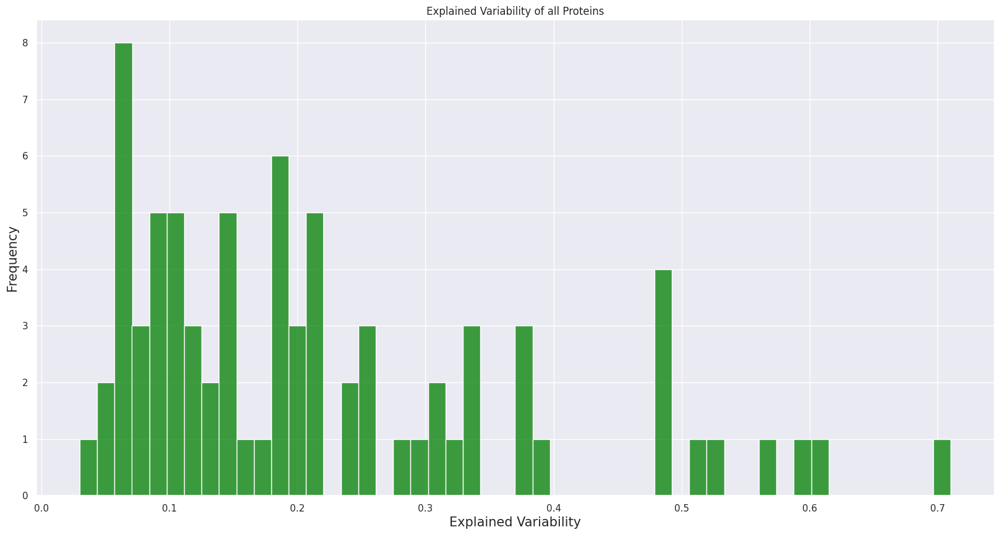

In [26]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.histplot(x='var_expl', data=anova_df, bins=50, color='green')
ax.set_title('Explained Variability of all Proteins', )
ax.set_xlabel("Explained Variability", fontsize=15)
ax.set_ylabel('Frequency', fontsize=15)
plt.show()

Number of Proteins with not significant mean differences among classes: 0

As we can see, ANOVA testing showed that there are no Proteins with not significant mean differences among classes (in other words, p value of each protein is much lower than significance level choosen, 

Therefore, we reject null hypothesis.

<br>

In [27]:
from Encoding import preprocessing

In [28]:
data=df.copy()
useless_columns = ['MouseID']
data.head()

,MouseID,DYRK1A,ITSN1,BDNF,NR1,NR2A,pAKT,pBRAF,pCAMKII,pCREB,pELK,pERK,pJNK,PKCA,pMEK,pNR1,pNR2A,pNR2B,pPKCAB,pRSK,AKT,BRAF,CAMKII,CREB,ELK,ERK,GSK3B,JNK,MEK,TRKA,RSK,APP,Bcatenin,SOD1,MTOR,P38,pMTOR,DSCR1,AMPKA,NR2B,pNUMB,RAPTOR,TIAM1,pP70S6,NUMB,P70S6,pGSK3B,pPKCG,CDK5,S6,ADARB1,AcetylH3K9,RRP1,BAX,ARC,ERBB4,nNOS,Tau,GFAP,GluR3,GluR4,IL1B,P3525,pCASP9,PSD95,SNCA,Ubiquitin,pGSK3B_Tyr216,SHH,BAD,BCL2,pS6,pCFOS,SYP,H3AcK18,EGR1,H3MeK4,CaNA,Genotype,Treatment,Behavior,Class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,0.687906,0.306382,0.402698,0.296927,1.022060,0.605673,1.877684,2.308745,0.441599,0.859366,0.416289,0.369608,0.178944,1.866358,3.685247,1.537227,0.264526,0.319677,0.813866,0.165846,0.453910,3.037621,0.369510,0.458539,0.335336,0.825192,0.576916,0.448099,0.586271,0.394721,0.339571,0.482864,0.294170,0.182150,0.842725,0.192608,1.443091,0.294700,0.354605,1.339070,0.170119,0.159102,0.188852,0.106305,0.144989,0.176668,0.125190,0.115291,0.228043,0.142756,0.430957,0.247538,1.603310,2.014875,0.108234,1.044979,0.831557,0.188852,0.122652,NaN,0.106305,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,0.695006,0.299051,0.385987,0.281319,0.956676,0.587559,1.725774,2.043037,0.445222,0.834659,0.400364,0.356178,0.173680,1.761047,3.485287,1.509249,0.255727,0.304419,0.780504,0.157194,0.430940,2.921882,0.342279,0.423560,0.324835,0.761718,0.545097,0.420876,0.545097,0.368255,0.321959,0.454519,0.276431,0.182086,0.847615,0.194815,1.439460,0.294060,0.354548,1.306323,0.171427,0.158129,0.184570,0.106592,0.150471,0.178309,0.134275,0.118235,0.238073,0.142037,0.457156,0.257632,1.671738,2.004605,0.109749,1.009883,0.849270,0.200404,0.116682,NaN,0.106592,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,1.561316,0.677348,0.291276,0.381002,0.281710,1.003635,0.602449,1.731873,2.017984,0.467668,0.814329,0.399847,0.368089,0.173905,1.765544,3.571456,1.501244,0.259614,0.311747,0.785154,0.160895,0.423187,2.944136,0.343696,0.425005,0.324852,0.757031,0.543620,0.404630,0.552994,0.363880,0.313086,0.447197,0.256648,0.184388,0.856166,0.200737,1.524364,0.301881,0.386087,1.279600,0.185456,0.148696,0.190532,0.108303,0.145330,0.176213,0.132560,0.117760,0.244817,0.142445,0.510472,0.255343,1.663550,2.016831,0.108196,0.996848,0.846709,0.193685,0.118508,NaN,0.108303,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,0.583277,0.296729,0.377087,0.313832,0.875390,0.520293,1.566852,2.132754,0.477671,0.727705,0.385639,0.362970,0.179449,1.286277,2.970137,1.419710,0.259536,0.279218,0.734492,0.162210,0.410615,2.500204,0.344509,0.429211,0.330121,0.746980,0.546763,0.386860,0.547849,0.366771,0.328492,0.442650,0.398534,0.161768,0.760234,0.184169,1.612382,0.296382,0.290680,1.198765,0.159799,0.166112,0.185323,0.103184,0.140656,0.163804,0.123210,0.117439,0.234947,0.145068,0.430996,0.251103,1.484624,1.957233,0.119883,0.990225,0.833277,0.192112,0.132781,NaN,0.103184,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,1.504230,0.550960,0.286961,0.363502,0.277964,0.864912,0.507990,1.480059,2.013697,0.483416,0.687794,0.367531,0.355311,0.174836,1.324695,2.896334,1.359876,0.250705,0.273667,0.702699,0.154827,0.398550,2.456560,0.329126,0.408755,0.313415,0.691956,0.536860,0.360816,0.512824,0.351551,0.312206,0.419095,0.393447,0.160200,0.768113,0.185718,1.645807,0.296829,0.309345,1.206995,0.164650,0.160687,0.188221,0.104784,0.141983,0.167710,0.136838,0.116048,0.255528,0.140871,0.481227,0.251773,1.534835,2.009109,0.119524,0.997775,0.878668,0.205604,0.1

In [29]:
data, X, y, mapping_code = preprocessing(data,useless_columns)
data.head()

,DYRK1A,ITSN1,BDNF,NR1,NR2A,pAKT,pBRAF,pCAMKII,pCREB,pELK,pERK,pJNK,PKCA,pMEK,pNR1,pNR2A,pNR2B,pPKCAB,pRSK,AKT,BRAF,CAMKII,CREB,ELK,ERK,GSK3B,JNK,MEK,TRKA,RSK,APP,Bcatenin,SOD1,MTOR,P38,pMTOR,DSCR1,AMPKA,NR2B,pNUMB,RAPTOR,TIAM1,pP70S6,NUMB,P70S6,pGSK3B,pPKCG,CDK5,S6,ADARB1,AcetylH3K9,RRP1,BAX,ARC,ERBB4,nNOS,Tau,GFAP,GluR3,GluR4,IL1B,P3525,pCASP9,PSD95,SNCA,Ubiquitin,pGSK3B_Tyr216,SHH,BAD,BCL2,pS6,pCFOS,SYP,H3AcK18,EGR1,H3MeK4,CaNA,Genotype,Treatment,Behavior,Class
0,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,0.687906,0.306382,0.402698,0.296927,1.022060,0.605673,1.877684,2.308745,0.441599,0.859366,0.416289,0.369608,0.178944,1.866358,3.685247,1.537227,0.264526,0.319677,0.813866,0.165846,0.453910,3.037621,0.369510,0.458539,0.335336,0.825192,0.576916,0.448099,0.586271,0.394721,0.339571,0.482864,0.294170,0.182150,0.842725,0.192608,1.443091,0.294700,0.354605,1.339070,0.170119,0.159102,0.188852,0.106305,0.144989,0.176668,0.125190,0.115291,0.228043,0.142756,0.430957,0.247538,1.603310,2.014875,0.108234,1.044979,0.831557,0.188852,0.122652,0.133482,0.106305,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,0.0,0.0,0.0,0.0
1,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,0.695006,0.299051,0.385987,0.281319,0.956676,0.587559,1.725774,2.043037,0.445222,0.834659,0.400364,0.356178,0.173680,1.761047,3.485287,1.509249,0.255727,0.304419,0.780504,0.157194,0.430940,2.921882,0.342279,0.423560,0.324835,0.761718,0.545097,0.420876,0.545097,0.368255,0.321959,0.454519,0.276431,0.182086,0.847615,0.194815,1.439460,0.294060,0.354548,1.306323,0.171427,0.158129,0.184570,0.106592,0.150471,0.178309,0.134275,0.118235,0.238073,0.142037,0.457156,0.257632,1.671738,2.004605,0.109749,1.009883,0.849270,0.200404,0.116682,0.133482,0.106592,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,0.0,0.0,0.0,0.0
2,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,1.561316,0.677348,0.291276,0.381002,0.281710,1.003635,0.602449,1.731873,2.017984,0.467668,0.814329,0.399847,0.368089,0.173905,1.765544,3.571456,1.501244,0.259614,0.311747,0.785154,0.160895,0.423187,2.944136,0.343696,0.425005,0.324852,0.757031,0.543620,0.404630,0.552994,0.363880,0.313086,0.447197,0.256648,0.184388,0.856166,0.200737,1.524364,0.301881,0.386087,1.279600,0.185456,0.148696,0.190532,0.108303,0.145330,0.176213,0.132560,0.117760,0.244817,0.142445,0.510472,0.255343,1.663550,2.016831,0.108196,0.996848,0.846709,0.193685,0.118508,0.133482,0.108303,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,0.0,0.0,0.0,0.0
3,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,0.583277,0.296729,0.377087,0.313832,0.875390,0.520293,1.566852,2.132754,0.477671,0.727705,0.385639,0.362970,0.179449,1.286277,2.970137,1.419710,0.259536,0.279218,0.734492,0.162210,0.410615,2.500204,0.344509,0.429211,0.330121,0.746980,0.546763,0.386860,0.547849,0.366771,0.328492,0.442650,0.398534,0.161768,0.760234,0.184169,1.612382,0.296382,0.290680,1.198765,0.159799,0.166112,0.185323,0.103184,0.140656,0.163804,0.123210,0.117439,0.234947,0.145068,0.430996,0.251103,1.484624,1.957233,0.119883,0.990225,0.833277,0.192112,0.132781,0.133482,0.103184,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,0.0,0.0,0.0,0.0
4,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,1.504230,0.550960,0.286961,0.363502,0.277964,0.864912,0.507990,1.480059,2.013697,0.483416,0.687794,0.367531,0.355311,0.174836,1.324695,2.896334,1.359876,0.250705,0.273667,0.702699,0.154827,0.398550,2.456560,0.329126,0.408755,0.313415,0.691956,0.536860,0.360816,0.512824,0.351551,0.312206,0.419095,0.393447,0.160200,0.768113,0.185718,1.645807,0.296829,0.309345,1.206995,0.164650,0.160687,0.188221,0.104784,0.141983,0.167710,0.136838,0.116048,0.255528,0.140871,0.481227,0.251773,1.534835,2.009109,0.119524,0.997775,0.878668,0.205604,0.129954,0.133482,0.104784,0.110694,0.434154,0.118481,0.140314,0.148380,1

### Statistical Analysis II

Lets visualizing correlations between columns using Pearson correlation

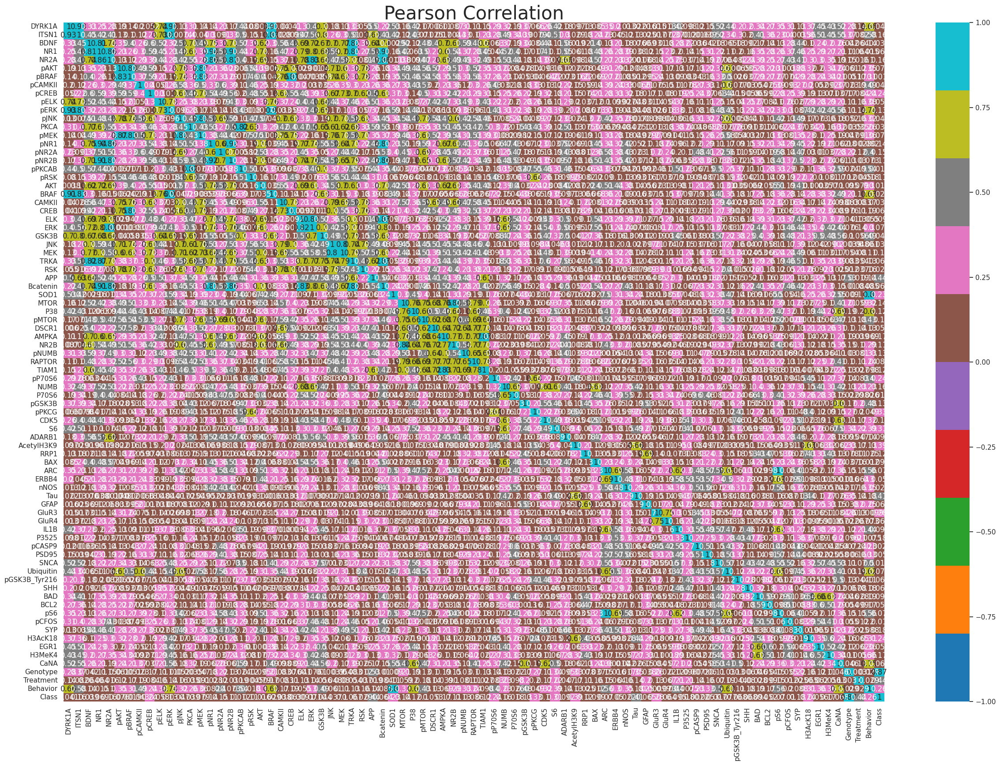

In [30]:
corr = data.corr(method='pearson').abs()

fig = plt.figure(figsize=(30,20))
sns.heatmap(corr, annot=True, cmap='tab10', vmin=-1, vmax=+1)
plt.title('Pearson Correlation', fontsize=30)
plt.show()

It seems that there is correlation between different columns of the date. This means class has multiple parameters to consider for its value.

In [31]:
data.corr()['Class'].abs().sort_values()

pBRAF        0.001913
pCASP9       0.002162
PSD95        0.005306
ELK          0.009122
pCFOS        0.010484
               ...   
Tau          0.405041
Treatment    0.436982
APP          0.439196
Genotype     0.871617
Class        1.000000
Name: Class, Length: 81, dtype: float64

In [32]:
X.head()

,DYRK1A,ITSN1,BDNF,NR1,NR2A,pAKT,pBRAF,pCAMKII,pCREB,pELK,pERK,pJNK,PKCA,pMEK,pNR1,pNR2A,pNR2B,pPKCAB,pRSK,AKT,BRAF,CAMKII,CREB,ELK,ERK,GSK3B,JNK,MEK,TRKA,RSK,APP,Bcatenin,SOD1,MTOR,P38,pMTOR,DSCR1,AMPKA,NR2B,pNUMB,RAPTOR,TIAM1,pP70S6,NUMB,P70S6,pGSK3B,pPKCG,CDK5,S6,ADARB1,AcetylH3K9,RRP1,BAX,ARC,ERBB4,nNOS,Tau,GFAP,GluR3,GluR4,IL1B,P3525,pCASP9,PSD95,SNCA,Ubiquitin,pGSK3B_Tyr216,SHH,BAD,BCL2,pS6,pCFOS,SYP,H3AcK18,EGR1,H3MeK4,CaNA,Genotype,Treatment,Behavior
0,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,0.687906,0.306382,0.402698,0.296927,1.022060,0.605673,1.877684,2.308745,0.441599,0.859366,0.416289,0.369608,0.178944,1.866358,3.685247,1.537227,0.264526,0.319677,0.813866,0.165846,0.453910,3.037621,0.369510,0.458539,0.335336,0.825192,0.576916,0.448099,0.586271,0.394721,0.339571,0.482864,0.294170,0.182150,0.842725,0.192608,1.443091,0.294700,0.354605,1.339070,0.170119,0.159102,0.188852,0.106305,0.144989,0.176668,0.125190,0.115291,0.228043,0.142756,0.430957,0.247538,1.603310,2.014875,0.108234,1.044979,0.831557,0.188852,0.122652,0.133482,0.106305,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,0.0,0.0,0.0
1,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,0.695006,0.299051,0.385987,0.281319,0.956676,0.587559,1.725774,2.043037,0.445222,0.834659,0.400364,0.356178,0.173680,1.761047,3.485287,1.509249,0.255727,0.304419,0.780504,0.157194,0.430940,2.921882,0.342279,0.423560,0.324835,0.761718,0.545097,0.420876,0.545097,0.368255,0.321959,0.454519,0.276431,0.182086,0.847615,0.194815,1.439460,0.294060,0.354548,1.306323,0.171427,0.158129,0.184570,0.106592,0.150471,0.178309,0.134275,0.118235,0.238073,0.142037,0.457156,0.257632,1.671738,2.004605,0.109749,1.009883,0.849270,0.200404,0.116682,0.133482,0.106592,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,0.0,0.0,0.0
2,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,1.561316,0.677348,0.291276,0.381002,0.281710,1.003635,0.602449,1.731873,2.017984,0.467668,0.814329,0.399847,0.368089,0.173905,1.765544,3.571456,1.501244,0.259614,0.311747,0.785154,0.160895,0.423187,2.944136,0.343696,0.425005,0.324852,0.757031,0.543620,0.404630,0.552994,0.363880,0.313086,0.447197,0.256648,0.184388,0.856166,0.200737,1.524364,0.301881,0.386087,1.279600,0.185456,0.148696,0.190532,0.108303,0.145330,0.176213,0.132560,0.117760,0.244817,0.142445,0.510472,0.255343,1.663550,2.016831,0.108196,0.996848,0.846709,0.193685,0.118508,0.133482,0.108303,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,0.0,0.0,0.0
3,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,0.583277,0.296729,0.377087,0.313832,0.875390,0.520293,1.566852,2.132754,0.477671,0.727705,0.385639,0.362970,0.179449,1.286277,2.970137,1.419710,0.259536,0.279218,0.734492,0.162210,0.410615,2.500204,0.344509,0.429211,0.330121,0.746980,0.546763,0.386860,0.547849,0.366771,0.328492,0.442650,0.398534,0.161768,0.760234,0.184169,1.612382,0.296382,0.290680,1.198765,0.159799,0.166112,0.185323,0.103184,0.140656,0.163804,0.123210,0.117439,0.234947,0.145068,0.430996,0.251103,1.484624,1.957233,0.119883,0.990225,0.833277,0.192112,0.132781,0.133482,0.103184,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,0.0,0.0,0.0
4,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,1.504230,0.550960,0.286961,0.363502,0.277964,0.864912,0.507990,1.480059,2.013697,0.483416,0.687794,0.367531,0.355311,0.174836,1.324695,2.896334,1.359876,0.250705,0.273667,0.702699,0.154827,0.398550,2.456560,0.329126,0.408755,0.313415,0.691956,0.536860,0.360816,0.512824,0.351551,0.312206,0.419095,0.393447,0.160200,0.768113,0.185718,1.645807,0.296829,0.309345,1.206995,0.164650,0.160687,0.188221,0.104784,0.141983,0.167710,0.136838,0.116048,0.255528,0.140871,0.481227,0.251773,1.534835,2.009109,0.119524,0.997775,0.878668,0.205604,0.129954,0.133482,0.104784,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,0.0,0.0,0.0


In [33]:
random.sample(list(y), 5)

[4, 7, 6, 0, 1]

In [34]:
c_CS_m = df[y == 0]
c_SC_m = df[y == 1]
c_CS_s = df[y == 2]
c_SC_s = df[y == 3]
t_cs_m = df[y == 4]
t_SC_m = df[y == 5]
t_CS_s = df[y == 6]
t_SC_s = df[y == 7]

### Visualizing Expression Level of each class for a given protein

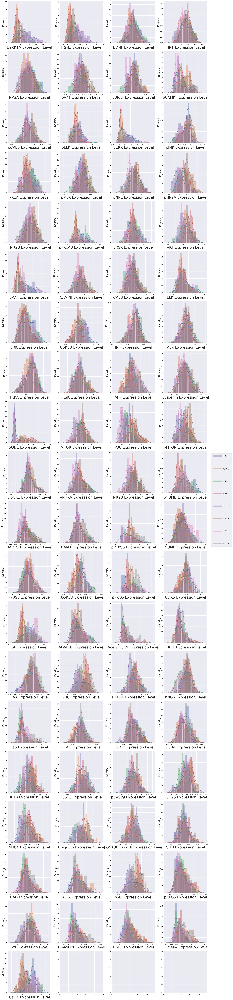

In [35]:
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(30, 150))

for protein, ax in zip(protein_types, axes.flatten()):
    sns.distplot(c_CS_m[protein],label='c_CS_m', ax=ax)
    sns.distplot(c_SC_m[protein],label='c_SC_m', ax=ax)
    sns.distplot(c_CS_s[protein],label='c_CS_s', ax=ax)
    sns.distplot(c_SC_s[protein],label='c_SC_s', ax=ax)
    sns.distplot(t_cs_m[protein],label='t_cs_m', ax=ax)
    sns.distplot(t_SC_m[protein],label='t_SC_m', ax=ax)
    sns.distplot(t_CS_s[protein],label='t_CS_s', ax=ax)
    sns.distplot(t_SC_s[protein],label='t_SC_s', ax=ax)
    ax.set_xlabel(f'{protein} Expression Level', fontsize=30)
    ax.set_ylabel('Density', fontsize=20)

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='center right', handlelength=5, borderpad=1, labelspacing=6, fontsize=15)
plt.show()

### Saving encoded data for training and testing

In [36]:
data.to_csv('Data/Data_Cortex_Nuclear_Encoded.csv', index=False)